In [1]:
import os, sys
from glob import glob
import numpy as np
import dask
import xarray as xr
import xgcm
from matplotlib import pyplot as plt
%matplotlib inline

from mitequinox.utils import *
from mitequinox.sigp import *
from mitequinox.plot import *

In [2]:
from dask_jobqueue import PBSCluster
# for heavy processing:
cluster = PBSCluster(cores=6, processes=6, walltime='02:00:00')
w = cluster.scale(6*10)

In [3]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [4]:
client

Client Scheduler: tcp://10.135.39.24:42301 Dashboard: http://10.135.39.24:8787/status,Cluster Workers: 60 Cores: 60 Memory: 1.00 TB


___________
# Useful info.

In [5]:
#grd = load_grd(ftype='nc').reset_coords()
grd = load_grd().reset_coords()
mask = ((grd.hFacW.rename({'i_g': 'i'}) == 1) &
        (grd.hFacS.rename({'j_g': 'j'}) == 1) 
       ).rename('mask').reset_coords(drop=True)
grd_rspec = xr.merge([mask, grd])
#print(grd_rspec)

# !! chunking is coarse for the netcdf grid

In [6]:
# coriolis term
lat = grd_rspec['YC']
omega = 7.3/100000
f_ij = 2*omega*np.sin(np.deg2rad(lat))
f_ij

<xarray.DataArray 'YC' (face: 13, j: 4320, i: 4320)>
dask.array<mul, shape=(13, 4320, 4320), dtype=float32, chunksize=(1, 4320, 4320), chunktype=numpy.ndarray>
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319

_____________
# Part 1: time acceleration term
## 1.1 $\partial u/\partial t$ and $\partial v/\partial t$

In [63]:
# spatial strides for decimation
dij=4
overwrite=True
    
for face in range(13):
#for face in [1]:

    Efile = work_data_dir+'xy/1_time_term/du_dt_f%02d.zarr'%(face)

    if not os.path.isdir(Efile) or overwrite:

        # load data
        dsu = ( xr.open_zarr(work_data_dir+'rechunked/%s_mbal_xy_f%02d.zarr'%('u',face))
                .isel(i_g=slice(0,None,dij), j=slice(0,None,dij)) )
        dsv = (xr.open_zarr(work_data_dir+'rechunked/%s_mbal_xy_f%02d.zarr'%('v',face))
               .isel(i=slice(0,None,dij), j_g=slice(0,None,dij)) )
        fs = f_ij.isel(face=face, i=slice(0,None,dij), j=slice(0,None,dij))
        
        ds = xr.merge([dsu.rename({'i_g': 'i'}), dsv.rename({'j_g': 'j'})], 
                      compat='equals').assign_coords(**grd_rspec.sel(face=face))

        # !!! check signs (checked on 08/30), will need to be normalized by Coriolis frequency !!!
        # compute ageostrophic velocities        
        d_SSU_dt_time = ( (-ds['v_coriolis_linear']/fs).shift(time=-1) - (-ds['v_coriolis_linear']/fs).shift(time=1) )/2/3600/fs
        d_SSU_dt_time = d_SSU_dt_time.rename('d_SSU_dt_time')      
        # should show the size of the dataset to know if we can load it in memory
        #print('dataset size: %.1f GB' %(d_SSU_dt_time.nbytes / 1e9))

        # store
        d_SSU_dt_time = d_SSU_dt_time.to_dataset()
        for c in d_SSU_dt_time.coords:
            try:
                del d_SSU_dt_time[c].encoding['chunks']
            except:
                print(c)        
        d_SSU_dt_time = d_SSU_dt_time.chunk({'i': 24*8, 'j':47*4})
        #print(d_SSU_dt_time)
        %time d_SSU_dt_time.to_zarr(Efile, mode='w')

        print('--- face %d done'%face)

    else:
        print('--- face %d allready computed'%face)

mask
CPU times: user 22.1 s, sys: 1.8 s, total: 23.9 s
Wall time: 38.4 s
--- face 0 done
mask
CPU times: user 23.8 s, sys: 1.78 s, total: 25.6 s
Wall time: 1min 9s
--- face 1 done
mask
CPU times: user 23.1 s, sys: 1.72 s, total: 24.8 s
Wall time: 48.5 s
--- face 2 done
mask
CPU times: user 20 s, sys: 1.52 s, total: 21.5 s
Wall time: 32.9 s
--- face 3 done
mask
CPU times: user 25.1 s, sys: 2.05 s, total: 27.1 s
Wall time: 1min 14s
--- face 4 done
mask
CPU times: user 18.6 s, sys: 1.42 s, total: 20 s
Wall time: 28.3 s
--- face 5 done
mask
CPU times: user 25.3 s, sys: 1.9 s, total: 27.2 s
Wall time: 53.5 s
--- face 6 done
mask
CPU times: user 25.9 s, sys: 2.03 s, total: 27.9 s
Wall time: 1min 8s
--- face 7 done
mask
CPU times: user 26 s, sys: 2.04 s, total: 28.1 s
Wall time: 1min 21s
--- face 8 done
mask
CPU times: user 23.6 s, sys: 1.83 s, total: 25.4 s
Wall time: 49.7 s
--- face 9 done
mask
CPU times: user 22.2 s, sys: 1.68 s, total: 23.9 s
Wall time: 49.9 s
--- face 10 done
mask
CPU ti

In [69]:
# spatial strides for decimation
dij=4
overwrite=True
    
for face in range(13):
#for face in [1]:

    Efile = work_data_dir+'xy/1_time_term/dv_dt_f%02d.zarr'%(face)

    if not os.path.isdir(Efile) or overwrite:

        # load data
        dsu = ( xr.open_zarr(work_data_dir+'rechunked/%s_mbal_xy_f%02d.zarr'%('u',face))
                .isel(i_g=slice(0,None,dij), j=slice(0,None,dij)) )
        dsv = (xr.open_zarr(work_data_dir+'rechunked/%s_mbal_xy_f%02d.zarr'%('v',face))
               .isel(i=slice(0,None,dij), j_g=slice(0,None,dij)) )
        fs = f_ij.isel(face=face, i=slice(0,None,dij), j=slice(0,None,dij))
        
        ds = xr.merge([dsu.rename({'i_g': 'i'}), dsv.rename({'j_g': 'j'})], 
                      compat='equals').assign_coords(**grd_rspec.sel(face=face))

        # !!! check signs (checked on 08/30), will need to be normalized by Coriolis frequency !!!
        # compute ageostrophic velocities        
        
        
        d_SSV_dt_time = ( (ds['u_coriolis_linear']/fs).shift(time=-1) - (ds['u_coriolis_linear']/fs).shift(time=1) )/2/3600/fs
        d_SSV_dt_time = d_SSV_dt_time.rename('d_SSV_dt_time')     
        
        # should show the size of the dataset to know if we can load it in memory
        #print('dataset size: %.1f GB' %(d_SSU_dt_time.nbytes / 1e9))

        # store
        d_SSV_dt_time = d_SSV_dt_time.to_dataset()
        for c in d_SSV_dt_time.coords:
            try:
                del d_SSV_dt_time[c].encoding['chunks']
            except:
                print(c)        
        d_SSV_dt_time = d_SSV_dt_time.chunk({'i': 24*8, 'j':47*4})
        %time d_SSV_dt_time.to_zarr(Efile, mode='w')

        print('--- face %d done'%face)

    else:
        print('--- face %d allready computed'%face)

mask
CPU times: user 21.8 s, sys: 1.57 s, total: 23.3 s
Wall time: 41.4 s
--- face 0 done
mask
CPU times: user 25.2 s, sys: 1.99 s, total: 27.2 s
Wall time: 1min 11s
--- face 1 done
mask
CPU times: user 23.6 s, sys: 1.78 s, total: 25.4 s
Wall time: 50.2 s
--- face 2 done
mask
CPU times: user 20.5 s, sys: 1.58 s, total: 22.1 s
Wall time: 34.7 s
--- face 3 done
mask
CPU times: user 26.2 s, sys: 2.17 s, total: 28.4 s
Wall time: 1min 16s
--- face 4 done
mask
CPU times: user 18.6 s, sys: 1.22 s, total: 19.8 s
Wall time: 28.1 s
--- face 5 done
mask
CPU times: user 24.9 s, sys: 2.05 s, total: 27 s
Wall time: 1min 4s
--- face 6 done
mask
CPU times: user 25.2 s, sys: 1.99 s, total: 27.2 s
Wall time: 1min 7s
--- face 7 done
mask
CPU times: user 25.9 s, sys: 2.15 s, total: 28 s
Wall time: 1min 19s
--- face 8 done
mask
CPU times: user 23.1 s, sys: 1.77 s, total: 24.9 s
Wall time: 44.5 s
--- face 9 done
mask
CPU times: user 22.4 s, sys: 1.63 s, total: 24 s
Wall time: 46.1 s
--- face 10 done
mask
CP

## 1.2 RMS results

### $\partial u/\partial t$ and $\partial v/\partial t$

In [5]:
F = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
dudt = xr.concat([xr.open_zarr(work_data_dir+'xy/1_time_term/du_dt_f%02d.zarr'%(face))
              for face in F], dim='face', compat='identical')
dvdt = xr.concat([xr.open_zarr(work_data_dir+'xy/1_time_term/dv_dt_f%02d.zarr'%(face))
              for face in F], dim='face', compat='identical')

In [6]:
dudt_RMS = (dudt['d_SSU_dt_time']**2).mean(['time'])
dudt_RMS = np.real(dudt_RMS).rename('dudt_RMS')

file_E = work_data_dir+'xy/1_time_term/dudt_RMS.zarr'
dudt_RMS.to_dataset().to_zarr(file_E, mode='w')  

In [8]:
dvdt_RMS = (dvdt['d_SSV_dt_time']**2).mean(['time'])
dvdt_RMS = np.real(dvdt_RMS).rename('dvdt_RMS')

file_E = work_data_dir+'xy/1_time_term/dvdt_RMS.zarr'
dvdt_RMS.to_dataset().to_zarr(file_E, mode='w')  

# 1.3 Read RMS results

In [7]:
dudt_RMS = xr.open_zarr(work_data_dir+'xy/1_time_term/dudt_RMS.zarr')
dvdt_RMS = xr.open_zarr(work_data_dir+'xy/1_time_term/dvdt_RMS.zarr')
dudt_RMS = dudt_RMS.dudt_RMS
dvdt_RMS = dvdt_RMS.dvdt_RMS

In [8]:
u_ageo_RMS = xr.open_zarr(work_data_dir+'xy/comparison/u_ageo_RMS.zarr')
v_ageo_RMS = xr.open_zarr(work_data_dir+'xy/comparison/v_ageo_RMS.zarr')
u_ageo_RMS = u_ageo_RMS.u_ageo_RMS
v_ageo_RMS = v_ageo_RMS.v_ageo_RMS

Text(0.5, 1.0, '(dudt+dvdt)/$(u_a+v_a)$ ratio')

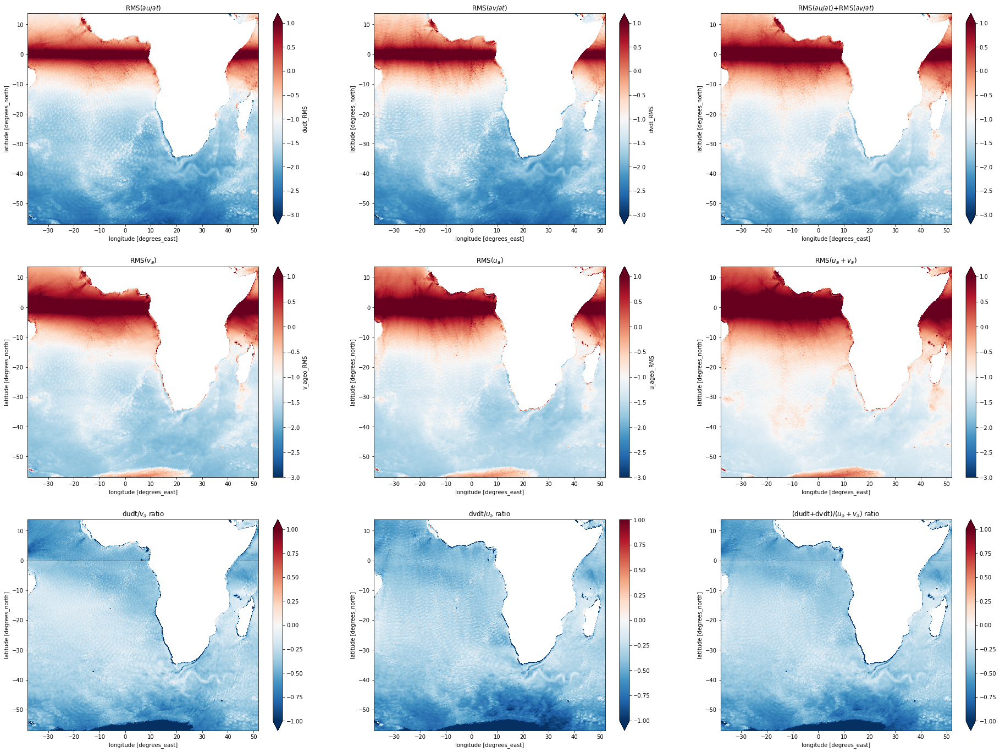

In [7]:
font_size = 12

face = 1
fig = plt.figure(figsize = (32,24))

ax=plt.subplot(331)
np.log10(dudt_RMS.isel(face=face)).plot(x='XC', y='YC',vmin=-3.,vmax=1.,cmap='RdBu_r')
ax.set_title('RMS($\partial u/\partial t$)',fontsize=font_size)

ax=plt.subplot(332)
np.log10(dvdt_RMS.isel(face=face)).plot(x='XC', y='YC',vmin=-3.,vmax=1.,cmap='RdBu_r')
ax.set_title('RMS($\partial v/\partial t$)',fontsize=font_size)

ax=plt.subplot(333)
np.log10(dudt_RMS.isel(face=face)+dvdt_RMS.isel(face=face)).plot(x='XC', y='YC',vmin=-3.,vmax=1.,cmap='RdBu_r')
ax.set_title('RMS($\partial u/\partial t$)+RMS($\partial v/\partial t$)',fontsize=font_size)

ax=plt.subplot(334)
np.log10(v_ageo_RMS.isel(face=face)).plot(x='XC', y='YC',vmin=-3.,vmax=1.,cmap='RdBu_r')
ax.set_title('RMS($v_a$)',fontsize=font_size)

ax=plt.subplot(335)
np.log10(u_ageo_RMS.isel(face=face)).plot(x='XC', y='YC',vmin=-3.,vmax=1.,cmap='RdBu_r')
ax.set_title('RMS($u_a$)',fontsize=font_size)

ax=plt.subplot(336)
np.log10(u_ageo_RMS.isel(face=face)+v_ageo_RMS.isel(face=face)).plot(x='XC', y='YC',vmin=-3.,vmax=1.,cmap='RdBu_r')
ax.set_title('RMS($u_a+v_a$)',fontsize=font_size)

ax=plt.subplot(337)
np.log10(dudt_RMS.isel(face=face)/v_ageo_RMS.isel(face=face)).plot(x='XC', y='YC',vmin=-1.,vmax=1.,cmap='RdBu_r')
ax.set_title('dudt/$v_a$ ratio',fontsize=font_size)

ax=plt.subplot(338)
np.log10(dvdt_RMS.isel(face=face)/u_ageo_RMS.isel(face=face)).plot(x='XC', y='YC',vmin=-1.,vmax=1.,cmap='RdBu_r')
ax.set_title('dvdt/$u_a$ ratio',fontsize=font_size)

ax=plt.subplot(339)
np.log10( (dudt_RMS.isel(face=face)+dvdt_RMS.isel(face=face))/(u_ageo_RMS.isel(face=face)+v_ageo_RMS.isel(face=face)) ).plot(x='XC', y='YC',vmin=-1.,vmax=1.,cmap='RdBu_r')
ax.set_title('(dudt+dvdt)/$(u_a+v_a)$ ratio',fontsize=font_size)


In [9]:
def quick_llc_plot(data, axis_off=False, **kwargs):
    face_to_axis = {0: (2, 0), 1: (1, 0), 2: (0, 0),
                    3: (2, 1), 4: (1, 1), 5: (0, 1),
                    7: (0, 2), 8: (1, 2), 9: (2, 2),
                    10: (0, 3), 11: (1, 3), 12: (2, 3)}
    transpose = [7, 8, 9, 10, 11, 12]
    gridspec_kw = dict(left=0, bottom=0, right=4, top=4, wspace=0, hspace=0)
    fig, axes = plt.subplots(nrows=3, ncols=4, gridspec_kw=gridspec_kw)
    for face, (j, i) in face_to_axis.items():
        data_ax = data.isel(face=face)
        ax = axes[j,i]
        yincrease = True
        if face in transpose:
            data_ax = data_ax.transpose()
            yincrease = False
        data_ax.plot(ax=ax, yincrease=yincrease, **kwargs)
        if axis_off:
            ax.axis('off')
        ax.set_title('')

In [10]:
ds_ice = xr.open_zarr(work_data_dir+'xy/sea_ice_mask.zarr')
dij=4 
ice = ds_ice.AREA.isel(i=slice(0,None,dij), j=slice(0,None,dij)) 
ice

<xarray.DataArray 'AREA' (face: 13, j: 1080, i: 1080)>
dask.array<getitem, shape=(13, 1080, 1080), dtype=float64, chunksize=(1, 1080, 1080), chunktype=numpy.ndarray>
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

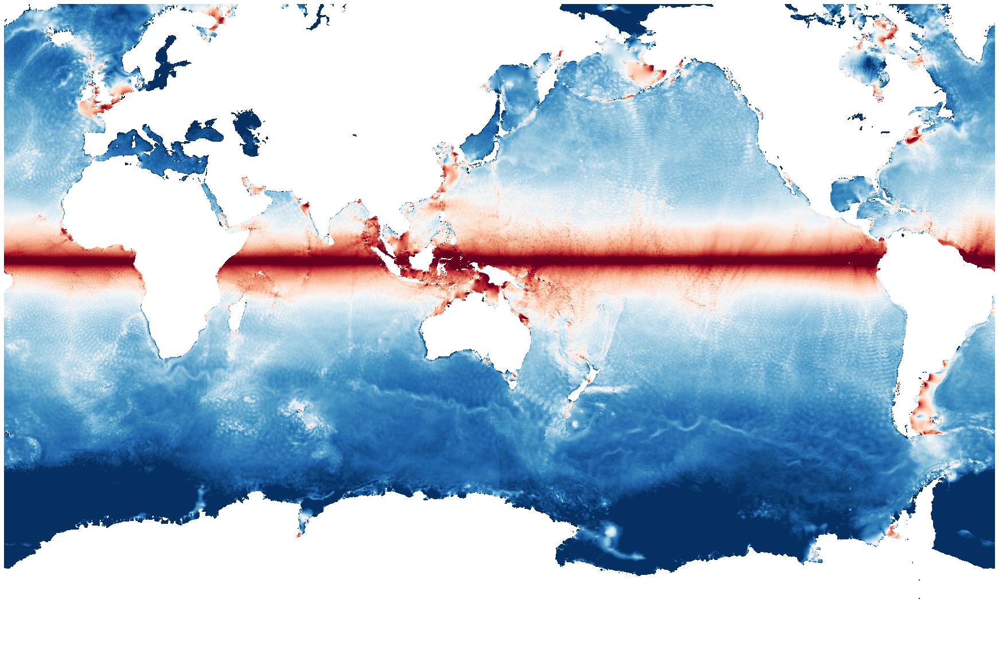

In [9]:
quick_llc_plot(np.log10(dudt_RMS), vmin=-3, vmax=1, add_colorbar=False, axis_off=True, cmap='RdBu_r')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

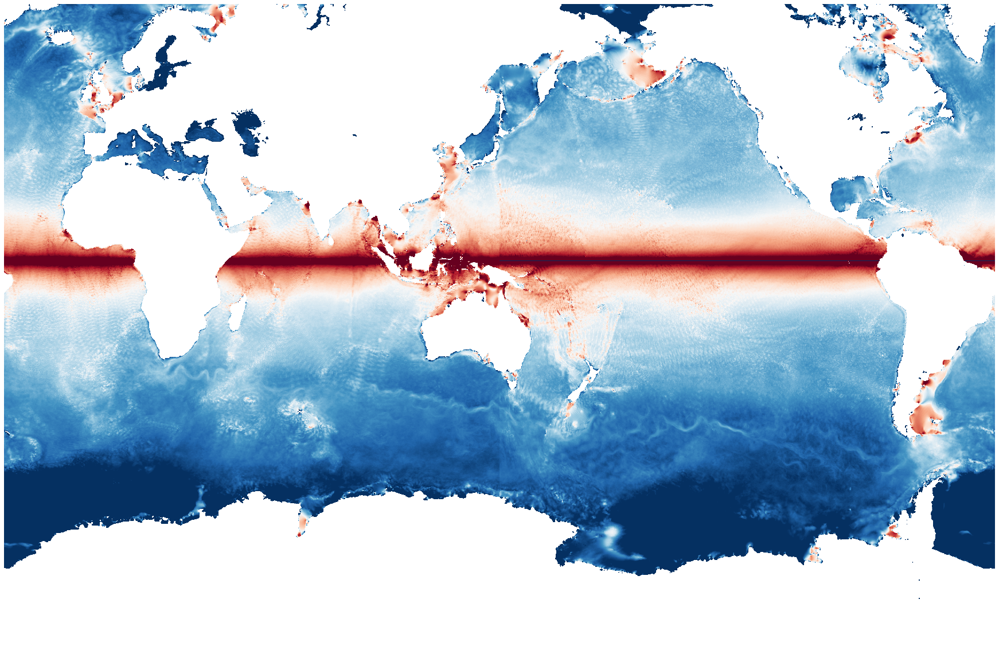

In [10]:
quick_llc_plot(np.log10(dvdt_RMS), vmin=-3, vmax=1, add_colorbar=False, axis_off=True, cmap='RdBu_r')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

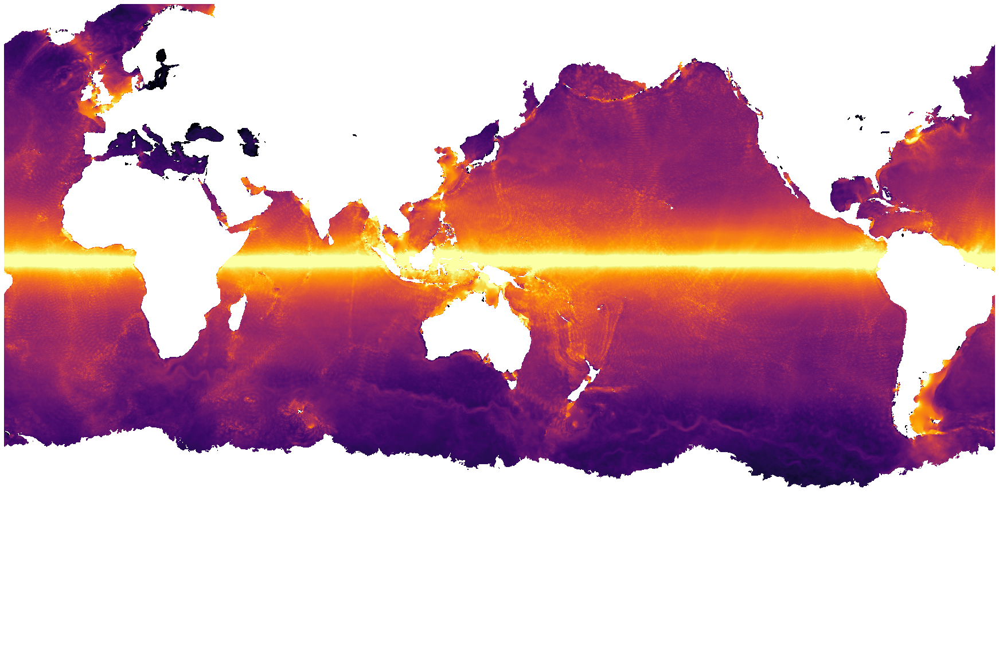

In [11]:
quick_llc_plot(np.log10( (dudt_RMS.where(ice>0)+dvdt_RMS.where(ice>0))), vmin=-3, vmax=1, add_colorbar=False, axis_off=True, cmap='inferno')

In [12]:
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
D = [xr.open_zarr(work_data_dir+'xy/1_time_term/E_omega_f%02d.zarr'%(face)) for face in face_all] 
ds_omega = xr.concat(D, dim='face')
print(ds_omega)

<xarray.Dataset>
Dimensions:      (face: 13, i: 1080, j: 1080)
Coordinates:
  * j            (j) int64 0 4 8 12 16 20 24 ... 4296 4300 4304 4308 4312 4316
  * i            (i) int64 0 4 8 12 16 20 24 ... 4296 4300 4304 4308 4312 4316
    Depth        (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    XC           (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    YC           (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dxC          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dxG          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dyC          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dyG          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    f_i          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    f_j          (face

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

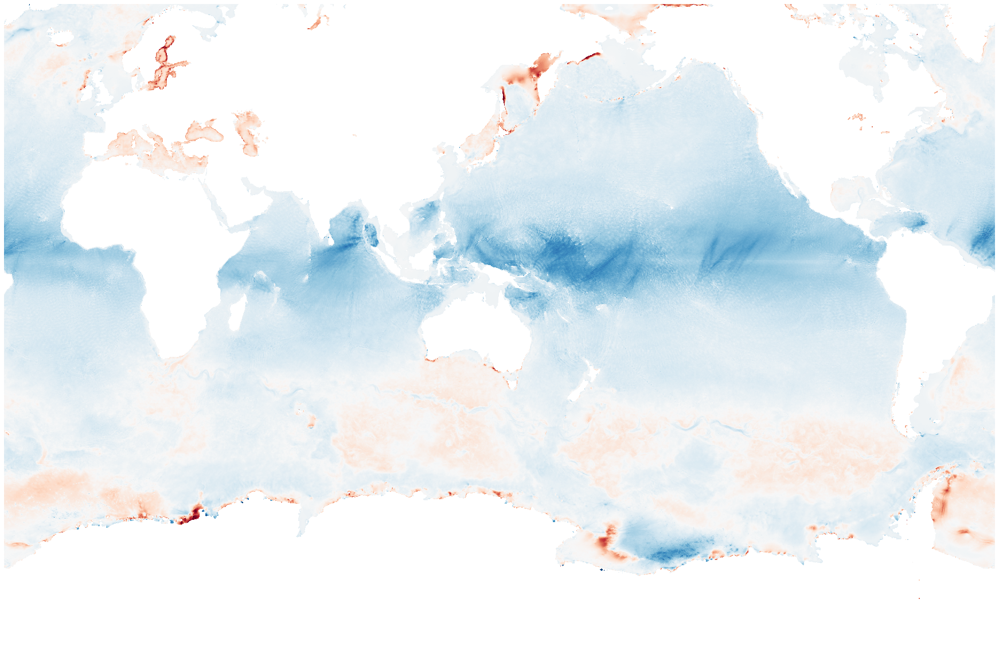

In [13]:
quick_llc_plot(np.log10( (dudt_RMS+dvdt_RMS)/ds_omega.E_omega), vmin=-1, vmax=1, add_colorbar=False, axis_off=True, cmap='RdBu_r')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

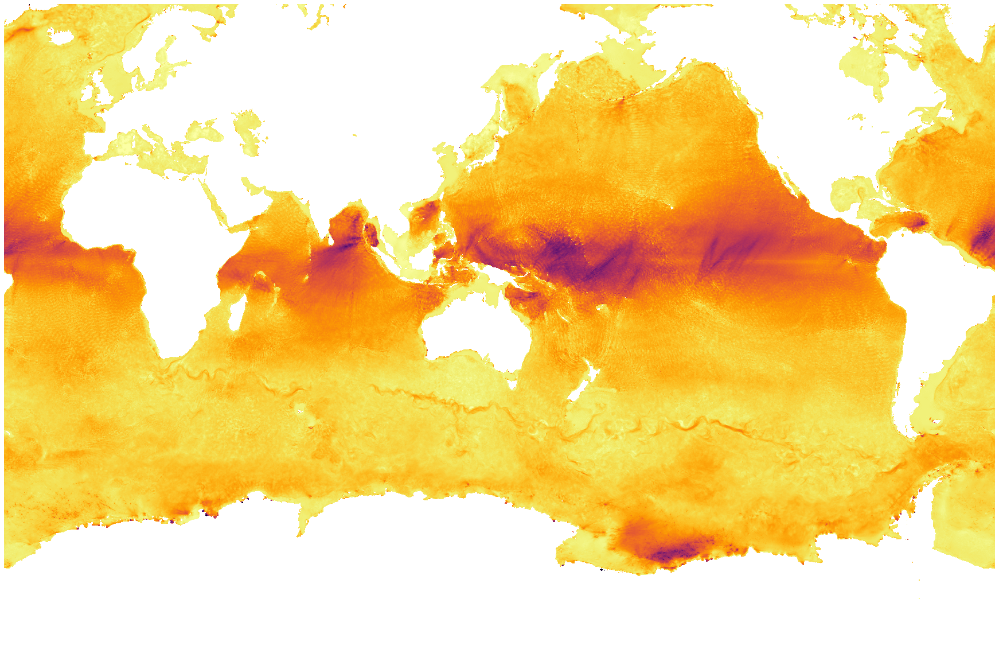

In [13]:
quick_llc_plot(np.log10( (dudt_RMS+dvdt_RMS)/ds_omega.E_omega_all), vmin=-1, vmax=0, add_colorbar=False, axis_off=True, cmap='inferno')

In [14]:
cluster.close()